In [1]:
!python --version

Python 3.11.11


In [2]:
# display information about available GPU devices
!nvidia-smi

Tue Jun 10 03:27:33 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P8              9W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
!pip install codecarbon

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 610.1/610.1 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.5/92.5 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: termcolor
    Found existing installation: termcolor 3.0.1
    Uninstalling termcolor-3.0.1:
      Successfully uninstalled termcolor-3.0.1
  Attempting uninstall: httpx
    Found existing installation: httpx 0.28.1
    Uninstalling httpx-0.28.1:
      Successfully uninstalled httpx-0.28.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-genai 1.9.0 requires httpx<1.0.0,>=0.28.1, but you have httpx 0.27.2 which is incompatible.


In [4]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Define dataset path
dataset_path = "/kaggle/input/dwaste-data-v4-annotated"

# Get class folders
class_folders = sorted([f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))])

# Initialize counters
class_counts = {cls: 0 for cls in class_folders}
missing_annotations = []
bbox_areas = []


In [5]:
from codecarbon import EmissionsTracker

In [6]:
# Iterate through each class folder
for cls in class_folders:
    class_path = os.path.join(dataset_path, cls)
    image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    for img_file in image_files:
        label_file = os.path.splitext(img_file)[0] + ".txt"
        label_path = os.path.join(class_path, label_file)

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                lines = f.readlines()
                class_counts[cls] += len(lines)
                
                for line in lines:
                    _, x_center, y_center, width, height = map(float, line.strip().split())
                    bbox_areas.append(width * height)  # Area of bounding box
        else:
            missing_annotations.append(img_file)

# Print summary
print(f"Total Classes: {len(class_folders)}")
print(f"Total Missing Annotations: {len(missing_annotations)}")
for cls, count in class_counts.items():
    print(f"{cls}: {count} annotations")


Total Classes: 7
Total Missing Annotations: 0
biological: 4498 annotations
cardboard: 2174 annotations
glass: 4993 annotations
metal: 1744 annotations
paper: 2329 annotations
plastic: 2752 annotations
trash: 1210 annotations


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


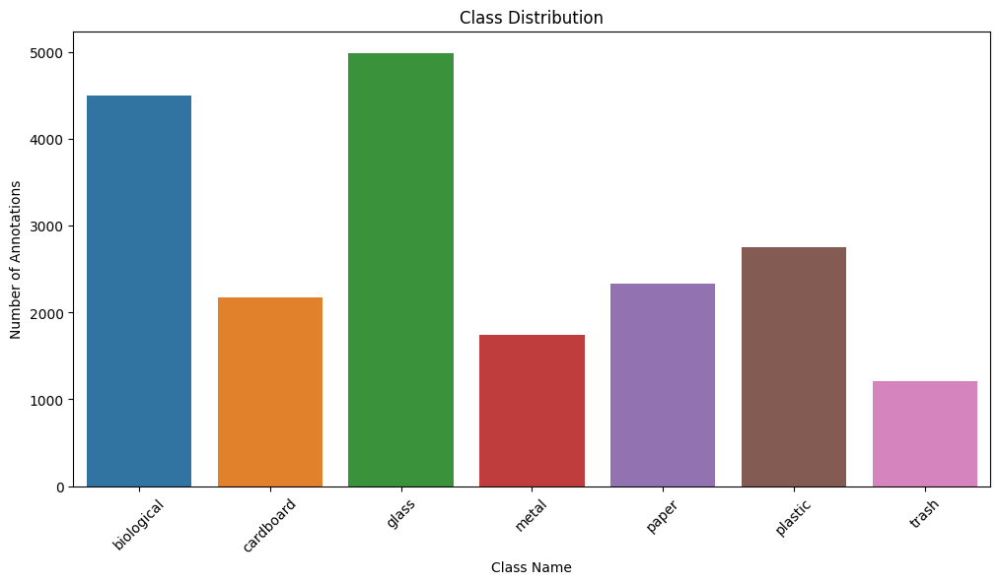

In [7]:
# Plot class distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Number of Annotations")
plt.title("Class Distribution")
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


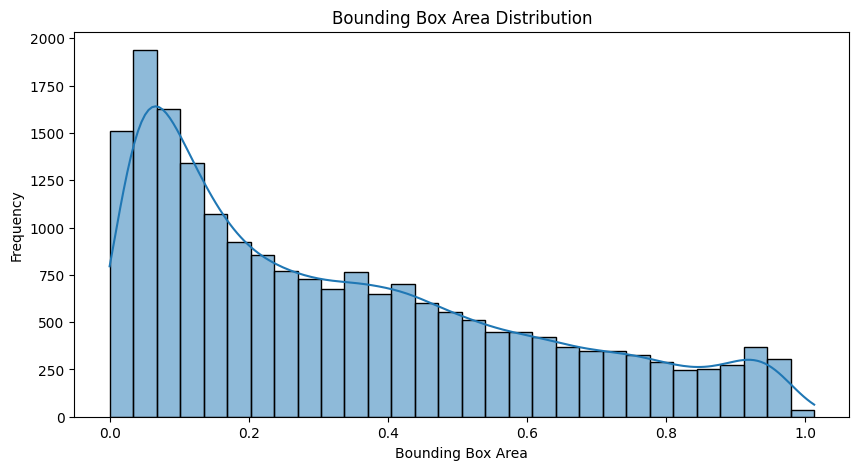

In [8]:
# Plot bounding box area distribution
plt.figure(figsize=(10, 5))
sns.histplot(bbox_areas, bins=30, kde=True)
plt.xlabel("Bounding Box Area")
plt.ylabel("Frequency")
plt.title("Bounding Box Area Distribution")
plt.show()

In [9]:
# Display sample images with annotations
def plot_sample_images(n=5):
    plt.figure(figsize=(15, 10))
    sample_classes = np.random.choice(class_folders, min(n, len(class_folders)), replace=False)

    for i, cls in enumerate(sample_classes):
        class_path = os.path.join(dataset_path, cls)
        image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        if not image_files:
            continue
        img_name = np.random.choice(image_files)
        img_path = os.path.join(class_path, img_name)
        label_path = os.path.join(class_path, os.path.splitext(img_name)[0] + ".txt")

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                lines = f.readlines()
                h, w, _ = img.shape
                for line in lines:
                    class_id, x_center, y_center, bbox_w, bbox_h = map(float, line.strip().split())
                    x1 = int((x_center - bbox_w / 2) * w)
                    y1 = int((y_center - bbox_h / 2) * h)
                    x2 = int((x_center + bbox_w / 2) * w)
                    y2 = int((y_center + bbox_h / 2) * h)

                    cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    cv2.putText(img, str(class_id), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

        plt.subplot(1, n, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(cls)

    plt.show()

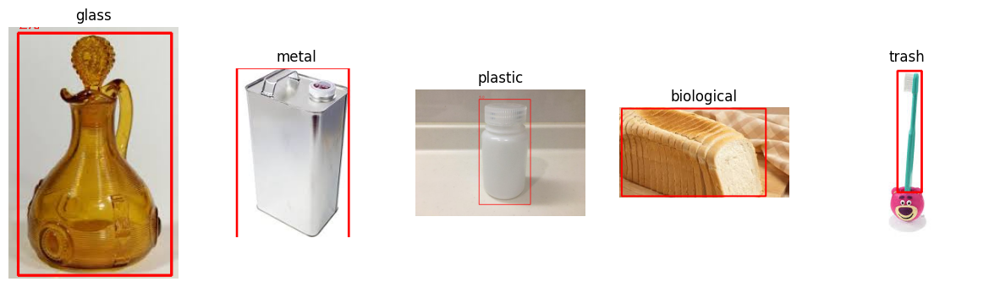

In [10]:
plot_sample_images()

### Since we have a class-imbalance, we will agument the data. 

In [11]:
prepare_data_emission_tracker = EmissionsTracker()
prepare_data_emission_tracker.start()

[codecarbon WARNING @ 03:29:09] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon INFO @ 03:29:09] [setup] RAM Tracking...
[codecarbon INFO @ 03:29:09] [setup] CPU Tracking...
[codecarbon WARNING @ 03:29:10] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon WARNING @ 03:29:10] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Linux OS detected: Please ensure RAPL files exist at /sys/class/powercap/intel-rapl/subsystem to measure CPU

[codecarbon INFO @ 03:29:10] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon WARNING @ 03:29:10] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 03:29:10] [setup] GPU Tracking...
[codecarbon INFO @ 03:29:11] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 03:29:11] The below tracking methods have been set up:
                RAM Tracking Method: RAM power estimation mode

In [12]:
experiment_name = "YOLO11n"

In [13]:
# # Paths
# dataset_path = "/kaggle/input/dwaste-data/dwaste-data"
# output_path = "/kaggle/working/combined_dataset"

In [14]:
import os
import cv2
import shutil
import random

# Paths
dataset_path = "/kaggle/input/dwaste-data-v4-annotated"
output_path = "/kaggle/working/combined_dataset"

os.makedirs(output_path, exist_ok=True)

# Define all class folders
class_folders = sorted([f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))])

# Count images in each class
class_image_counts = {}
for cls in class_folders:
    class_path = os.path.join(dataset_path, cls)
    images = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    class_image_counts[cls] = len(images)

# Identify minority classes (less than 75% of max class size)
max_class_count = max(class_image_counts.values())
minority_classes = [cls for cls, count in class_image_counts.items() if count < 0.75 * max_class_count]
minority_class_min = min(class_image_counts[cls] for cls in minority_classes)

print("📊 Class counts:", class_image_counts)
print("🔎 Auto-identified minority classes:", minority_classes)
print("📉 Undersampling all majority classes to:", minority_class_min)

# Track missing annotations
missing_annotations = []

for cls in class_folders:
    class_path = os.path.join(dataset_path, cls)
    combined_class_path = os.path.join(output_path, cls)
    os.makedirs(combined_class_path, exist_ok=True)

    all_images = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Apply undersampling if this is a majority class
    if cls not in minority_classes and len(all_images) > minority_class_min:
        images = random.sample(all_images, minority_class_min)
    else:
        images = all_images

    for img_file in images:
        img_path = os.path.join(class_path, img_file)
        img = cv2.imread(img_path)
        if img is None:
            print(f"❌ Failed to load image: {img_path}")
            continue

        # Copy image
        shutil.copy(img_path, os.path.join(combined_class_path, img_file))

        # Copy label
        label_file = os.path.splitext(img_file)[0] + ".txt"
        label_path = os.path.join(class_path, label_file)
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(combined_class_path, label_file))
        else:
            missing_annotations.append(img_file)

print(f"✅ Undersampling complete.\n🚫 Missing annotations for {len(missing_annotations)} images.")


📊 Class counts: {'biological': 983, 'cardboard': 1810, 'glass': 3039, 'metal': 994, 'paper': 1650, 'plastic': 1915, 'trash': 772}
🔎 Auto-identified minority classes: ['biological', 'cardboard', 'metal', 'paper', 'plastic', 'trash']
📉 Undersampling all majority classes to: 772


[codecarbon INFO @ 03:29:29] Energy consumed for RAM : 0.000083 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:29:29] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:29:29] Energy consumed for All CPU : 0.000177 kWh
[codecarbon INFO @ 03:29:29] Energy consumed for all GPUs : 0.000080 kWh. Total GPU Power : 19.11326290648429 W
[codecarbon INFO @ 03:29:29] 0.000340 kWh of electricity used since the beginning.
[codecarbon INFO @ 03:29:44] Energy consumed for RAM : 0.000167 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:29:44] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:29:44] Energy consumed for All CPU : 0.000354 kWh
[codecarbon INFO @ 03:29:44] Energy consumed for all GPUs : 0.000160 kWh. Total GPU Power : 19.177489559326613 W
[codecarbon INFO @ 03:29:44] 0.000680 kWh of electricity used since the beginning.
[codecarbon INFO @ 03:29:59] Energy consumed for RAM : 0.000250 kWh. RAM Power : 

✅ Undersampling complete.
🚫 Missing annotations for 0 images.


In [15]:
original_data_path = '/kaggle/input/dwaste-data-v4-annotated'
augmented_data_path = '/kaggle/working/combined_dataset'
# Select a class to visualize
class_to_visualize = "trash"  # Change this to any class

# Get image paths
original_images_path = os.path.join(original_data_path, class_to_visualize)
augmented_images_path = os.path.join(augmented_data_path, class_to_visualize)

# List image files
original_images = [f for f in os.listdir(original_images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
augmented_images = [f for f in os.listdir(augmented_images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Select one image for testing
if not original_images:
    print("No images found in the original dataset.")
else:
    test_image = random.choice(original_images)
    print(f"Selected test image: {test_image}")

def draw_yolo_bboxes(image, annotation_path):
    """Draw bounding boxes from YOLO annotation file on the image."""
    h, w, _ = image.shape
    if os.path.exists(annotation_path):
        with open(annotation_path, "r") as file:
            for line in file:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue  # Skip invalid annotations
                
                class_id, x_center, y_center, bbox_width, bbox_height = map(float, parts)

                # Convert YOLO format (normalized) to pixel coordinates
                x1 = int((x_center - bbox_width / 2) * w)
                y1 = int((y_center - bbox_height / 2) * h)
                x2 = int((x_center + bbox_width / 2) * w)
                y2 = int((y_center + bbox_height / 2) * h)

                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(image, str(class_id), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    else:
        print(f"Annotation file not found: {annotation_path}")
    
    return image

# Define file paths for original and augmented images
orig_img_path = os.path.join(original_images_path, test_image)
orig_annot_path = orig_img_path.replace(".jpg", ".txt").replace(".jpeg", ".txt").replace(".png", ".txt")

# Find corresponding augmented image
aug_img_name = test_image.replace(".jpg", "_aug_0.jpg").replace(".jpeg", "_aug_0.jpg").replace(".png", "_aug_0.jpg")
aug_img_path = os.path.join(augmented_images_path, aug_img_name)
aug_annot_path = aug_img_path.replace(".jpg", ".txt")

# Load images
if os.path.exists(orig_img_path) and os.path.exists(aug_img_path):
    orig_img = cv2.imread(orig_img_path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    orig_img = draw_yolo_bboxes(orig_img, orig_annot_path)

    aug_img = cv2.imread(aug_img_path)
    aug_img = cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB)
    aug_img = draw_yolo_bboxes(aug_img, aug_annot_path)

    # Plot images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Original
    axes[0].imshow(orig_img)
    axes[0].set_title("Original with Bounding Boxes")
    axes[0].axis("off")

    # Augmented
    axes[1].imshow(aug_img)
    axes[1].set_title("Augmented with Bounding Boxes")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

else:
    print(f"Missing original or augmented image: {test_image}")


Selected test image: trash_644.jpg
Missing original or augmented image: trash_644.jpg


In [16]:
# Step 1: Check if each image (original + augmented) has a corresponding label
missing_labels = []
for cls in minority_classes:
    combined_class_path = os.path.join(output_path, cls)
    all_images = [f for f in os.listdir(combined_class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    for img_file in all_images:
        label_file = os.path.join(combined_class_path, os.path.splitext(img_file)[0] + ".txt")
        
        # If label file is missing or empty, log it
        if not os.path.exists(label_file) or os.stat(label_file).st_size == 0:
            missing_labels.append(img_file)



In [17]:
# Step 2: Report missing labels
if missing_labels:
    print(f"⚠️ Missing or empty labels for {len(missing_labels)} images:")
    print(missing_labels)
else:
    print("✅ All images (original + augmented) have valid labels. Proceeding with YOLO training.")



⚠️ Missing or empty labels for 1 images:
['cardboard_1896.jpg']


In [18]:
# Step 2: Create train.txt with all image paths
train_txt_path = os.path.join(output_path, "train.txt")
with open(train_txt_path, "w") as f:
    for cls in class_folders:
        combined_class_path = os.path.join(output_path, cls)
        all_images = [f for f in os.listdir(combined_class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        for img_file in all_images:
            f.write(os.path.join(combined_class_path, img_file) + "\n")

print("📂 Training data list created: train.txt")
print("🚀 Ready to train YOLO model!")

📂 Training data list created: train.txt
🚀 Ready to train YOLO model!


In [19]:
# Define paths
dataset_path = "/kaggle/working/combined_dataset"
train_txt_path = os.path.join(dataset_path, "train.txt")
val_txt_path = os.path.join(dataset_path, "val.txt")

# Read train.txt
with open(train_txt_path, "r") as file:
    lines = file.readlines()

# Shuffle and split (80% train, 20% validation)
random.shuffle(lines)
split_idx = int(0.8 * len(lines))
train_lines = lines[:split_idx]
val_lines = lines[split_idx:]

# Save new train.txt and val.txt
with open(train_txt_path, "w") as file:
    file.writelines(train_lines)

with open(val_txt_path, "w") as file:
    file.writelines(val_lines)

print(f"✅ New train.txt: {len(train_lines)} samples")
print(f"✅ New val.txt: {len(val_lines)} samples")


✅ New train.txt: 7116 samples
✅ New val.txt: 1780 samples


In [20]:
prepare_data_emissions: float = prepare_data_emission_tracker.stop()
print(f"Prepare Data Carbon Emissions: {prepare_data_emissions} kg")

[codecarbon INFO @ 03:31:07] Energy consumed for RAM : 0.000628 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:31:07] Delta energy consumed for CPU with constant : 0.000096 kWh, power : 42.5 W
[codecarbon INFO @ 03:31:07] Energy consumed for All CPU : 0.001335 kWh
[codecarbon INFO @ 03:31:07] Energy consumed for all GPUs : 0.000600 kWh. Total GPU Power : 18.96268439836492 W
[codecarbon INFO @ 03:31:07] 0.002564 kWh of electricity used since the beginning.
[codecarbon INFO @ 03:31:07] 0.006468 g.CO2eq/s mean an estimation of 203.97405681420767 kg.CO2eq/year


Prepare Data Carbon Emissions: 0.0007320325126868752 kg


In [21]:
develop_model_emission_tracker = EmissionsTracker()
develop_model_emission_tracker.start()
start_time = time.time()

[codecarbon WARNING @ 03:31:07] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon INFO @ 03:31:07] [setup] RAM Tracking...
[codecarbon INFO @ 03:31:07] [setup] CPU Tracking...
[codecarbon WARNING @ 03:31:08] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon WARNING @ 03:31:08] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Linux OS detected: Please ensure RAPL files exist at /sys/class/powercap/intel-rapl/subsystem to measure CPU

[codecarbon INFO @ 03:31:08] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon WARNING @ 03:31:08] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 03:31:08] [setup] GPU Tracking...
[codecarbon INFO @ 03:31:08] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 03:31:08] The below tracking methods have been set up:
                RAM Tracking Method: RAM power estimation mode

In [22]:
# setup
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.152 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6362.0/8062.4 GB disk)


In [23]:
dataset_yaml = f"""
path: /kaggle/working/combined_dataset
train: train.txt
val: val.txt

nc: 7  # Number of classes
names: ["biological", "cardboard", "glass", "metal", "paper", "plastic", "trash"]
"""

# Save dataset.yaml
dataset_yaml_path = "/kaggle/working/combined_dataset/dataset.yaml"
os.makedirs(os.path.dirname(dataset_yaml_path), exist_ok=True)

with open(dataset_yaml_path, "w") as file:
    file.write(dataset_yaml)

print(f"Dataset YAML saved at: {dataset_yaml_path}")


Dataset YAML saved at: /kaggle/working/combined_dataset/dataset.yaml


In [24]:
# Define dataset path
dataset_path = "/kaggle/working/combined_dataset"

# Get class folders
class_folders = sorted([f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))])

# Initialize counters
updated_class_counts = {cls: 0 for cls in class_folders}

# Iterate through each class folder
for cls in class_folders:
    class_path = os.path.join(dataset_path, cls)
    image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    for img_file in image_files:
        label_file = os.path.splitext(img_file)[0] + ".txt"
        label_path = os.path.join(class_path, label_file)

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                lines = f.readlines()
                updated_class_counts[cls] += len(lines)  # Count number of bounding boxes

# Print the updated dataset summary
print("Updated Annotation Counts After Augmentation:")
for cls, count in updated_class_counts.items():
    print(f"{cls}: {count} annotations")

# Total annotations after augmentation
total_annotations = sum(updated_class_counts.values())
print(f"\nTotal Annotations in Combined Dataset: {total_annotations}")


Updated Annotation Counts After Augmentation:
biological: 4498 annotations
cardboard: 2174 annotations
glass: 1228 annotations
metal: 1744 annotations
paper: 2329 annotations
plastic: 2752 annotations
trash: 1210 annotations

Total Annotations in Combined Dataset: 15935


In [25]:

# Compute class weights using inverse frequency
total_annotations = sum(updated_class_counts.values())

class_weights = {
    cls: round(total_annotations / (count + 1e-6), 4)  # Avoid division by zero
    for cls, count in updated_class_counts.items()
}

# Normalize weights (optional, keeps them between 0 and 1)
max_weight = max(class_weights.values())
class_weights = {cls: round(w / max_weight, 4) for cls, w in class_weights.items()}

# Print computed class weights
print("\nComputed Class Weights for YOLO:")
for cls, weight in class_weights.items():
    print(f"{cls}: {weight}")


Computed Class Weights for YOLO:
biological: 0.269
cardboard: 0.5566
glass: 0.9853
metal: 0.6938
paper: 0.5195
plastic: 0.4397
trash: 1.0


In [26]:
import yaml
# Load the existing YAML file
with open(dataset_yaml_path, "r") as f:
    yaml_data = yaml.safe_load(f)

# Add or update class weights
yaml_data["weights"] = list(class_weights.values())

# Add scale and image size
# yaml_data["scale"] = [0.00392156862745098, 0.00392156862745098, 0.00392156862745098]
# yaml_data["imgsz"] = [320, 224]

# Write the updated YAML file
with open(dataset_yaml_path, "w") as f:
    yaml.dump(yaml_data, f, default_flow_style=False)

print("\n✅ Updated class weights applied to dataset.yaml successfully!")



✅ Updated class weights applied to dataset.yaml successfully!


In [27]:
from ultralytics import YOLO
from IPython.display import Image, display

# Load the trained YOLO model
model = YOLO('yolo11n.pt')

results = model.train(data = dataset_yaml_path,
            epochs=20,
            imgsz=[320, 224],
            batch=2,           # 🔽 Try reducing this to fit memory
            workers=1, 
            device=0,
            lr0=0.01,  # initial learning rate
            lrf=0.01,  # final learning rate
            save_period=10,
                      amp=False 
           )
# scale=0.00392156862745098

[codecarbon INFO @ 03:32:26] Energy consumed for RAM : 0.000416 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:32:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:32:26] Energy consumed for All CPU : 0.000885 kWh
[codecarbon INFO @ 03:32:26] Energy consumed for all GPUs : 0.000397 kWh. Total GPU Power : 19.06135562734296 W
[codecarbon INFO @ 03:32:26] 0.001699 kWh of electricity used since the beginning.


100%|██████████| 5.35M/5.35M [00:00<00:00, 58.7MB/s]


Ultralytics 8.3.152 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/combined_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=[320, 224], int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, 

100%|██████████| 755k/755k [00:00<00:00, 18.3MB/s]


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/combined_dataset/biological... 7116 images, 1 backgrounds, 16 corrupt: 100%|██████████| 7116/7116 [00:05<00:00, 1416.88it/s]

train: /kaggle/working/combined_dataset/cardboard/cardboard_120.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0015]
train: /kaggle/working/combined_dataset/cardboard/cardboard_1714.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0109]
train: /kaggle/working/combined_dataset/cardboard/cardboard_1963.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0044]
train: /kaggle/working/combined_dataset/cardboard/cardboard_2061.jpg: corrupt JPEG restored and saved
train: /kaggle/working/combined_dataset/cardboard/cardboard_2078.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0026]
train: /kaggle/working/combined_dataset/cardboard/cardboard_368.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0059]
train: /kaggle/working/combined_dataset/cardboard/cardboard_387.jpg: ignoring corrupt image/label: non-normali

train: New cache created: /kaggle/working/combined_dataset/biological.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 237.6±105.6 MB/s, size: 9.7 KB)


val: Scanning /kaggle/working/combined_dataset/biological... 1780 images, 0 backgrounds, 7 corrupt: 100%|██████████| 1780/1780 [00:01<00:00, 1176.27it/s]

val: /kaggle/working/combined_dataset/cardboard/cardboard_1116.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0228]
val: /kaggle/working/combined_dataset/cardboard/cardboard_126.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0059]
val: /kaggle/working/combined_dataset/cardboard/cardboard_330.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0103]
val: /kaggle/working/combined_dataset/cardboard/cardboard_808.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0029]
val: /kaggle/working/combined_dataset/cardboard/cardboard_914.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0073      1.0103]
val: /kaggle/working/combined_dataset/paper/paper_2400.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0044]
val: /kaggle/working/combined_dataset/plastic/plastic_2377.jpg: 

Plotting labels to runs/detect/train/labels.jpg... 


[codecarbon INFO @ 03:32:41] Energy consumed for RAM : 0.000500 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:32:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:32:41] Energy consumed for All CPU : 0.001062 kWh
[codecarbon INFO @ 03:32:41] Energy consumed for all GPUs : 0.000518 kWh. Total GPU Power : 28.90450820104694 W
[codecarbon INFO @ 03:32:41] 0.002080 kWh of electricity used since the beginning.


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 320 train, 320 val
Using 1 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      0.24G      1.342      3.614      1.428         11        320:   2%|▏         | 82/3550 [00:08<04:49, 11.97it/s][codecarbon INFO @ 03:32:56] Energy consumed for RAM : 0.000583 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:32:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:32:56] Energy consumed for All CPU : 0.001239 kWh
[codecarbon INFO @ 03:32:56] Energy consumed for all GPUs : 0.000680 kWh. Total GPU Power : 39.02408915007061 W
[codecarbon INFO @ 03:32:56] 0.002502 kWh of electricity used since the beginning.
       1/20     0.248G      1.261      3.541       1.38          6        320:   8%|▊         | 268/3550 [00:23<04:00, 13.67it/s][codecarbon INFO @ 03:33:11] Energy consumed for RAM : 0.000666 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:33:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:33:11] Energy consumed for All CPU : 0.001416 kWh
[codecarbon INFO @ 0

                   all       1773       3149      0.379      0.536       0.45      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20     0.275G      1.165      2.118      1.326         11        320:   2%|▏         | 76/3550 [00:05<04:01, 14.38it/s][codecarbon INFO @ 03:37:26] Energy consumed for RAM : 0.002082 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:37:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:37:26] Energy consumed for All CPU : 0.004425 kWh
[codecarbon INFO @ 03:37:26] Energy consumed for all GPUs : 0.004078 kWh. Total GPU Power : 44.405101478013464 W
[codecarbon INFO @ 03:37:26] 0.010584 kWh of electricity used since the beginning.
       2/20     0.279G      1.219      2.072      1.364          5        320:   8%|▊         | 288/3550 [00:20<03:46, 14.40it/s][codecarbon INFO @ 03:37:41] Energy consumed for RAM : 0.002165 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:37:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:37:41] Energy consumed for All CPU : 0.004602 kWh
[codecarbon INFO @ 

                   all       1773       3149      0.554      0.566      0.555      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20     0.287G      1.243      1.983      1.393          9        320:   2%|▏         | 82/3550 [00:05<03:59, 14.46it/s][codecarbon INFO @ 03:41:56] Energy consumed for RAM : 0.003581 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:41:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:41:56] Energy consumed for All CPU : 0.007610 kWh
[codecarbon INFO @ 03:41:56] Energy consumed for all GPUs : 0.007661 kWh. Total GPU Power : 46.396987577697956 W
[codecarbon INFO @ 03:41:56] 0.018852 kWh of electricity used since the beginning.
       3/20     0.287G      1.232      1.927      1.358          7        320:   8%|▊         | 294/3550 [00:20<03:53, 13.96it/s][codecarbon INFO @ 03:42:11] Energy consumed for RAM : 0.003664 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:42:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:42:11] Energy consumed for All CPU : 0.007787 kWh
       3/20     0.2

                   all       1773       3149      0.563      0.608      0.599      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20     0.287G      1.175      1.726      1.351          5        320:   3%|▎         | 110/3550 [00:07<04:06, 13.96it/s][codecarbon INFO @ 03:46:26] Energy consumed for RAM : 0.005080 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:46:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:46:26] Energy consumed for All CPU : 0.010796 kWh
[codecarbon INFO @ 03:46:26] Energy consumed for all GPUs : 0.011364 kWh. Total GPU Power : 47.88386493986478 W
[codecarbon INFO @ 03:46:26] 0.027240 kWh of electricity used since the beginning.
       4/20     0.287G      1.159      1.775      1.334          5        320:   9%|▉         | 322/3550 [00:22<03:41, 14.59it/s][codecarbon INFO @ 03:46:41] Energy consumed for RAM : 0.005163 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:46:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:46:41] Energy consumed for All CPU : 0.010973 kWh
[codecarbon INFO @ 

                   all       1773       3149      0.634      0.614      0.635      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20     0.287G      1.182      1.712       1.34         11        320:   4%|▍         | 148/3550 [00:10<03:56, 14.41it/s][codecarbon INFO @ 03:50:56] Energy consumed for RAM : 0.006579 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:50:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:50:56] Energy consumed for All CPU : 0.013982 kWh
[codecarbon INFO @ 03:50:56] Energy consumed for all GPUs : 0.015118 kWh. Total GPU Power : 48.483662163702746 W
[codecarbon INFO @ 03:50:56] 0.035679 kWh of electricity used since the beginning.
       5/20     0.287G      1.139      1.697       1.33          8        320:  10%|█         | 362/3550 [00:25<03:33, 14.96it/s][codecarbon INFO @ 03:51:11] Energy consumed for RAM : 0.006662 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:51:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:51:11] Energy consumed for All CPU : 0.014159 kWh
[codecarbon INFO @

                   all       1773       3149      0.643      0.617      0.648      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20     0.287G      1.114      1.598      1.279          3        320:   5%|▌         | 194/3550 [00:13<03:51, 14.53it/s][codecarbon INFO @ 03:55:26] Energy consumed for RAM : 0.008078 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:55:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:55:26] Energy consumed for All CPU : 0.017167 kWh
[codecarbon INFO @ 03:55:26] Energy consumed for all GPUs : 0.018863 kWh. Total GPU Power : 49.33370693131486 W
[codecarbon INFO @ 03:55:26] 0.044109 kWh of electricity used since the beginning.
       6/20     0.287G      1.116      1.588      1.286          3        320:  12%|█▏        | 410/3550 [00:28<03:38, 14.34it/s][codecarbon INFO @ 03:55:41] Energy consumed for RAM : 0.008161 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:55:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:55:41] Energy consumed for All CPU : 0.017344 kWh
[codecarbon INFO @ 

                   all       1773       3149      0.705      0.652      0.699      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20     0.287G      0.812      1.338       1.11          6        320:   0%|          | 8/3550 [00:00<04:10, 14.13it/s][codecarbon INFO @ 03:59:41] Energy consumed for RAM : 0.009494 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:59:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:59:41] Energy consumed for All CPU : 0.020176 kWh
[codecarbon INFO @ 03:59:41] Energy consumed for all GPUs : 0.022398 kWh. Total GPU Power : 46.32026290073606 W
[codecarbon INFO @ 03:59:41] 0.052068 kWh of electricity used since the beginning.
       7/20     0.287G      1.076      1.575      1.283         10        320:   6%|▌         | 220/3550 [00:15<03:52, 14.35it/s][codecarbon INFO @ 03:59:56] Energy consumed for RAM : 0.009577 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 03:59:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 03:59:56] Energy consumed for All CPU : 0.020353 kWh
[codecarbon INFO @ 03

                   all       1773       3149      0.683      0.613      0.674       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20     0.299G      1.169      1.392      1.276          9        320:   1%|          | 20/3550 [00:01<04:00, 14.67it/s][codecarbon INFO @ 04:04:11] Energy consumed for RAM : 0.010993 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:04:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:04:11] Energy consumed for All CPU : 0.023362 kWh
[codecarbon INFO @ 04:04:11] Energy consumed for all GPUs : 0.026130 kWh. Total GPU Power : 46.27725297648114 W
[codecarbon INFO @ 04:04:11] 0.060485 kWh of electricity used since the beginning.
       8/20     0.299G      1.051      1.429       1.26          7        320:   7%|▋         | 234/3550 [00:16<03:44, 14.74it/s][codecarbon INFO @ 04:04:26] Energy consumed for RAM : 0.011076 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:04:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:04:26] Energy consumed for All CPU : 0.023539 kWh
[codecarbon INFO @ 0

                   all       1773       3149      0.693      0.672      0.721      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20     0.299G      1.106       1.39      1.275          8        320:   1%|          | 36/3550 [00:02<04:02, 14.49it/s][codecarbon INFO @ 04:08:41] Energy consumed for RAM : 0.012492 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:08:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:08:41] Energy consumed for All CPU : 0.026547 kWh
[codecarbon INFO @ 04:08:41] Energy consumed for all GPUs : 0.029863 kWh. Total GPU Power : 46.635285562436366 W
[codecarbon INFO @ 04:08:41] 0.068902 kWh of electricity used since the beginning.
       9/20     0.299G       1.04      1.363      1.251          6        320:   7%|▋         | 252/3550 [00:17<03:51, 14.26it/s][codecarbon INFO @ 04:08:56] Energy consumed for RAM : 0.012575 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:08:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:08:56] Energy consumed for All CPU : 0.026724 kWh
[codecarbon INFO @ 

                   all       1773       3149      0.704      0.676      0.725       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20     0.299G      1.018      1.341       1.23         11        320:   2%|▏         | 84/3550 [00:06<04:43, 12.24it/s][codecarbon INFO @ 04:13:11] Energy consumed for RAM : 0.013991 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:13:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:13:11] Energy consumed for All CPU : 0.029733 kWh
[codecarbon INFO @ 04:13:11] Energy consumed for all GPUs : 0.033613 kWh. Total GPU Power : 47.477636689662205 W
[codecarbon INFO @ 04:13:11] 0.077337 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:13:11] 0.008892 g.CO2eq/s mean an estimation of 280.4026740318558 kg.CO2eq/year
      10/20     0.299G      1.047      1.393      1.268          5        320:   8%|▊         | 298/3550 [00:21<03:43, 14.52it/s][codecarbon INFO @ 04:13:26] Energy consumed for RAM : 0.014074 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:13:26] Delta energy consumed for CPU with constant : 0.000177 kWh, powe

                   all       1773       3149      0.747      0.657      0.746      0.535


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20     0.299G     0.8892      1.182      1.186          2        320:   1%|          | 39/3550 [00:02<04:08, 14.15it/s][codecarbon INFO @ 04:17:41] Energy consumed for RAM : 0.015490 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:17:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:17:41] Energy consumed for All CPU : 0.032919 kWh
[codecarbon INFO @ 04:17:41] Energy consumed for all GPUs : 0.037323 kWh. Total GPU Power : 46.414612007603345 W
[codecarbon INFO @ 04:17:41] 0.085731 kWh of electricity used since the beginning.
      11/20     0.299G     0.9372      1.148      1.199          3        320:   7%|▋         | 251/3550 [00:17<03:47, 14.48it/s][codecarbon INFO @ 04:17:56] Energy consumed for RAM : 0.015573 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:17:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:17:56] Energy consumed for All CPU : 0.033096 kWh
[codecarbon INFO @ 

                   all       1773       3149      0.643      0.674      0.694      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20     0.299G     0.9624      1.159      1.211          3        320:   2%|▏         | 64/3550 [00:04<04:18, 13.47it/s][codecarbon INFO @ 04:22:11] Energy consumed for RAM : 0.016989 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:22:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:22:11] Energy consumed for All CPU : 0.036104 kWh
[codecarbon INFO @ 04:22:11] Energy consumed for all GPUs : 0.041057 kWh. Total GPU Power : 46.889676444183245 W
[codecarbon INFO @ 04:22:11] 0.094151 kWh of electricity used since the beginning.
      12/20     0.299G     0.9771      1.195      1.234          2        320:   8%|▊         | 282/3550 [00:19<03:44, 14.53it/s][codecarbon INFO @ 04:22:26] Energy consumed for RAM : 0.017072 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:22:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:22:26] Energy consumed for All CPU : 0.036281 kWh
[codecarbon INFO @ 

                   all       1773       3149      0.693      0.635      0.692      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20     0.299G     0.8832      1.091      1.218          4        320:   2%|▏         | 78/3550 [00:05<03:51, 14.98it/s][codecarbon INFO @ 04:26:41] Energy consumed for RAM : 0.018488 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:26:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:26:41] Energy consumed for All CPU : 0.039290 kWh
[codecarbon INFO @ 04:26:41] Energy consumed for all GPUs : 0.044788 kWh. Total GPU Power : 47.45333505982875 W
[codecarbon INFO @ 04:26:41] 0.102566 kWh of electricity used since the beginning.
      13/20     0.299G     0.9333      1.063      1.225          2        320:   8%|▊         | 292/3550 [00:20<04:05, 13.28it/s][codecarbon INFO @ 04:26:56] Energy consumed for RAM : 0.018571 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:26:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:26:56] Energy consumed for All CPU : 0.039467 kWh
[codecarbon INFO @ 0

                   all       1773       3149      0.675      0.688      0.725      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20     0.299G     0.9538      1.104       1.23          3        320:   3%|▎         | 106/3550 [00:07<04:24, 13.01it/s][codecarbon INFO @ 04:31:11] Energy consumed for RAM : 0.019987 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:31:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:31:11] Energy consumed for All CPU : 0.042476 kWh
[codecarbon INFO @ 04:31:11] Energy consumed for all GPUs : 0.048520 kWh. Total GPU Power : 48.04409103950069 W
[codecarbon INFO @ 04:31:11] 0.110983 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:31:11] 0.008872 g.CO2eq/s mean an estimation of 279.7968487137446 kg.CO2eq/year
      14/20     0.299G     0.9559      1.082      1.217          3        320:   9%|▉         | 326/3550 [00:22<03:49, 14.07it/s][codecarbon INFO @ 04:31:26] Energy consumed for RAM : 0.020070 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:31:26] Delta energy consumed for CPU with constant : 0.000177 kWh, powe

                   all       1773       3149      0.687      0.679      0.715      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20     0.312G     0.8789     0.9601      1.179          2        320:   4%|▍         | 134/3550 [00:09<04:00, 14.20it/s][codecarbon INFO @ 04:35:41] Energy consumed for RAM : 0.021486 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:35:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:35:41] Energy consumed for All CPU : 0.045661 kWh
[codecarbon INFO @ 04:35:41] Energy consumed for all GPUs : 0.052263 kWh. Total GPU Power : 48.55071812313233 W
[codecarbon INFO @ 04:35:41] 0.119410 kWh of electricity used since the beginning.
      15/20     0.312G     0.9048     0.9616      1.193          4        320:  10%|▉         | 350/3550 [00:24<03:44, 14.23it/s][codecarbon INFO @ 04:35:56] Energy consumed for RAM : 0.021569 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:35:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:35:56] Energy consumed for All CPU : 0.045838 kWh
[codecarbon INFO @ 

                   all       1773       3149      0.695      0.687      0.734      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20     0.312G     0.8894      1.008      1.173          2        320:   4%|▎         | 126/3550 [00:09<03:57, 14.42it/s][codecarbon INFO @ 04:40:11] Energy consumed for RAM : 0.022985 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:40:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:40:11] Energy consumed for All CPU : 0.048847 kWh
[codecarbon INFO @ 04:40:11] Energy consumed for all GPUs : 0.055981 kWh. Total GPU Power : 47.608558238646125 W
[codecarbon INFO @ 04:40:11] 0.127813 kWh of electricity used since the beginning.
      16/20     0.312G     0.8833     0.9299      1.163          7        320:  10%|▉         | 340/3550 [00:24<03:41, 14.50it/s][codecarbon INFO @ 04:40:26] Energy consumed for RAM : 0.023068 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:40:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:40:26] Energy consumed for All CPU : 0.049024 kWh
[codecarbon INFO @

                   all       1773       3149      0.695      0.691       0.73      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20     0.312G     0.9282     0.8977      1.173          2        320:   1%|          | 42/3550 [00:03<04:28, 13.06it/s][codecarbon INFO @ 04:44:41] Energy consumed for RAM : 0.024484 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:44:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:44:41] Energy consumed for All CPU : 0.052033 kWh
      17/20     0.312G     0.9237     0.9011      1.173          2        320:   1%|          | 42/3550 [00:03<04:28, 13.06it/s][codecarbon INFO @ 04:44:41] Energy consumed for all GPUs : 0.059678 kWh. Total GPU Power : 46.914042528952216 W
[codecarbon INFO @ 04:44:41] 0.136195 kWh of electricity used since the beginning.
      17/20     0.312G     0.8637     0.9019      1.153          2        320:   7%|▋         | 240/3550 [00:18<04:05, 13.49it/s][codecarbon INFO @ 04:44:56] Energy consumed for RAM : 0.024567 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:44:56] Delta energy consumed for CPU with con

                   all       1773       3149      0.716      0.706      0.745      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20     0.312G     0.8773     0.8453       1.18          4        320:   3%|▎         | 96/3550 [00:07<04:13, 13.65it/s][codecarbon INFO @ 04:49:26] Energy consumed for RAM : 0.026066 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:49:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:49:26] Energy consumed for All CPU : 0.055395 kWh
[codecarbon INFO @ 04:49:26] Energy consumed for all GPUs : 0.063525 kWh. Total GPU Power : 46.341080577762526 W
[codecarbon INFO @ 04:49:26] 0.144986 kWh of electricity used since the beginning.
      18/20     0.312G     0.8724     0.8706      1.171          2        320:   9%|▊         | 302/3550 [00:22<03:56, 13.74it/s][codecarbon INFO @ 04:49:41] Energy consumed for RAM : 0.026150 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:49:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:49:41] Energy consumed for All CPU : 0.055572 kWh
[codecarbon INFO @ 

                   all       1773       3149      0.753      0.699      0.776      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20     0.312G     0.8167     0.8149      1.133          2        320:   4%|▍         | 146/3550 [00:11<04:08, 13.71it/s][codecarbon INFO @ 04:54:11] Energy consumed for RAM : 0.027649 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:54:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:54:11] Energy consumed for All CPU : 0.058758 kWh
[codecarbon INFO @ 04:54:11] Energy consumed for all GPUs : 0.067326 kWh. Total GPU Power : 46.777428550281805 W
[codecarbon INFO @ 04:54:11] 0.153733 kWh of electricity used since the beginning.
      19/20     0.312G     0.8045      0.796      1.131          2        320:  10%|▉         | 350/3550 [00:26<03:55, 13.61it/s][codecarbon INFO @ 04:54:26] Energy consumed for RAM : 0.027732 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:54:26] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:54:26] Energy consumed for All CPU : 0.058935 kWh
[codecarbon INFO @

                   all       1773       3149      0.735      0.735      0.787       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20     0.312G      0.851     0.7706      1.163          2        320:   5%|▌         | 186/3550 [00:14<04:03, 13.79it/s][codecarbon INFO @ 04:58:56] Energy consumed for RAM : 0.029231 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:58:56] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:58:56] Energy consumed for All CPU : 0.062121 kWh
[codecarbon INFO @ 04:58:56] Energy consumed for all GPUs : 0.071117 kWh. Total GPU Power : 47.095011509097645 W
[codecarbon INFO @ 04:58:56] 0.162469 kWh of electricity used since the beginning.
      20/20     0.312G     0.8341     0.7705      1.144          5        320:  11%|█         | 390/3550 [00:29<03:51, 13.65it/s][codecarbon INFO @ 04:59:11] Energy consumed for RAM : 0.029314 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 04:59:11] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 04:59:11] Energy consumed for All CPU : 0.062298 kWh
[codecarbon INFO @

                   all       1773       3149      0.759      0.712      0.779      0.572



20 epochs completed in 1.512 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.152 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  82%|████████▏ | 364/444 [00:11<00:02, 34.14it/s][codecarbon INFO @ 05:03:41] Energy consumed for RAM : 0.030813 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 05:03:41] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 05:03:41] Energy consumed for All CPU : 0.065483 kWh
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  83%|████████▎ | 368/444 [00:11<00:02, 34.25it/s][codecarbon INFO @ 05:03:41] Energy consumed for all GPUs : 0.074861 kWh. Total GPU Power : 44.82820787444415 W
[codecarbon INFO @ 05:03:41] 0.171158 kWh of electricity used since the beginning.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 444/444 [00:13<00:00, 31.84it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa

                   all       1773       3149      0.737      0.733      0.787       0.58
            biological        220        990      0.734      0.498      0.625      0.366
             cardboard        358        415      0.808       0.86      0.899      0.756
                 glass        145        209      0.743      0.789      0.848      0.654
                 metal        186        306      0.676      0.838      0.818      0.617
                 paper        325        440      0.771      0.595      0.753      0.541
               plastic        380        553      0.839      0.839      0.894      0.689
                 trash        159        236      0.586      0.712      0.672      0.436
Speed: 0.1ms preprocess, 3.5ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train


In [28]:
end_time = time.time()
training_time = end_time - start_time
develop_model_emissions: float = develop_model_emission_tracker.stop()
print(f"Develop Model Carbon Emissions: {develop_model_emissions} kg")
print("Total training time: {:.2f} seconds".format(training_time))

[codecarbon INFO @ 05:03:58] Energy consumed for RAM : 0.030904 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 05:03:58] Delta energy consumed for CPU with constant : 0.000017 kWh, power : 42.5 W
[codecarbon INFO @ 05:03:58] Energy consumed for All CPU : 0.065677 kWh
[codecarbon INFO @ 05:03:58] Energy consumed for all GPUs : 0.075052 kWh. Total GPU Power : 41.08780235926434 W
[codecarbon INFO @ 05:03:58] 0.171633 kWh of electricity used since the beginning.


Develop Model Carbon Emissions: 0.04900189582991025 kg
Total training time: 5566.57 seconds


In [29]:
# evaluate model performance on the validation set
model_results = model.val() 

# Access precision, recall, and F1-score for all classes
precision = model_results.box.mean_results()[0]  # mean precision
recall = model_results.box.mean_results()[1]     # mean recall
f1_score = model_results.box.mean_results()[2]   # mean F1-score

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Ultralytics 8.3.152 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1291.1±1347.0 MB/s, size: 114.1 KB)


val: Scanning /kaggle/working/combined_dataset/biological.cache... 1780 images, 0 backgrounds, 7 corrupt: 100%|██████████| 1780/1780 [00:00<?, ?it/s]

val: /kaggle/working/combined_dataset/cardboard/cardboard_1116.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0228]
val: /kaggle/working/combined_dataset/cardboard/cardboard_126.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0059]
val: /kaggle/working/combined_dataset/cardboard/cardboard_330.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0103]
val: /kaggle/working/combined_dataset/cardboard/cardboard_808.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0029]
val: /kaggle/working/combined_dataset/cardboard/cardboard_914.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0073      1.0103]
val: /kaggle/working/combined_dataset/paper/paper_2400.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0044]
val: /kaggle/working/combined_dataset/plastic/plastic_2377.jpg: 


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 887/887 [00:18<00:00, 48.61it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1773       3149      0.737      0.732      0.787       0.58
            biological        220        990      0.736      0.498      0.625      0.366
             cardboard        358        415      0.807       0.86      0.899      0.756
                 glass        145        209      0.742      0.785      0.848      0.654
                 metal        186        306      0.676      0.837      0.818      0.617
                 paper        325        440      0.773      0.595      0.753      0.541
               plastic        380        553      0.839      0.839      0.894      0.689
                 trash        159        236      0.587      0.712      0.672      0.436
Speed: 0.1ms preprocess, 6.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train2
Precision: 0.7370
Recall: 0.7324
F1-score: 0.7870


In [30]:
# Export the model to ONNX format
# model.export(format="onnx", imgsz=[320, 224])

/kaggle/working/runs/detect/train/F1_curve.png


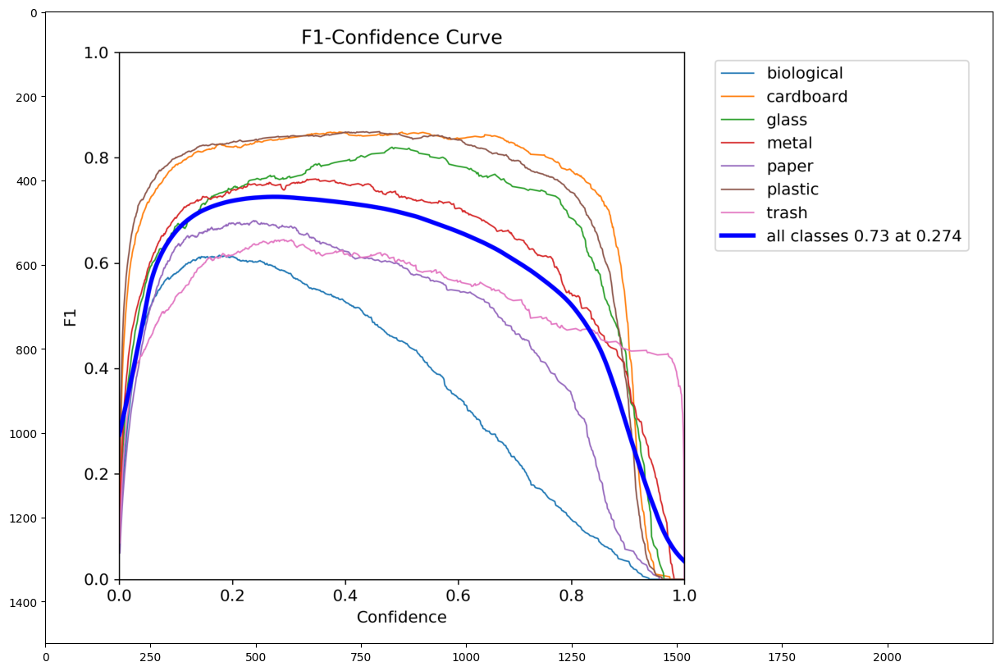

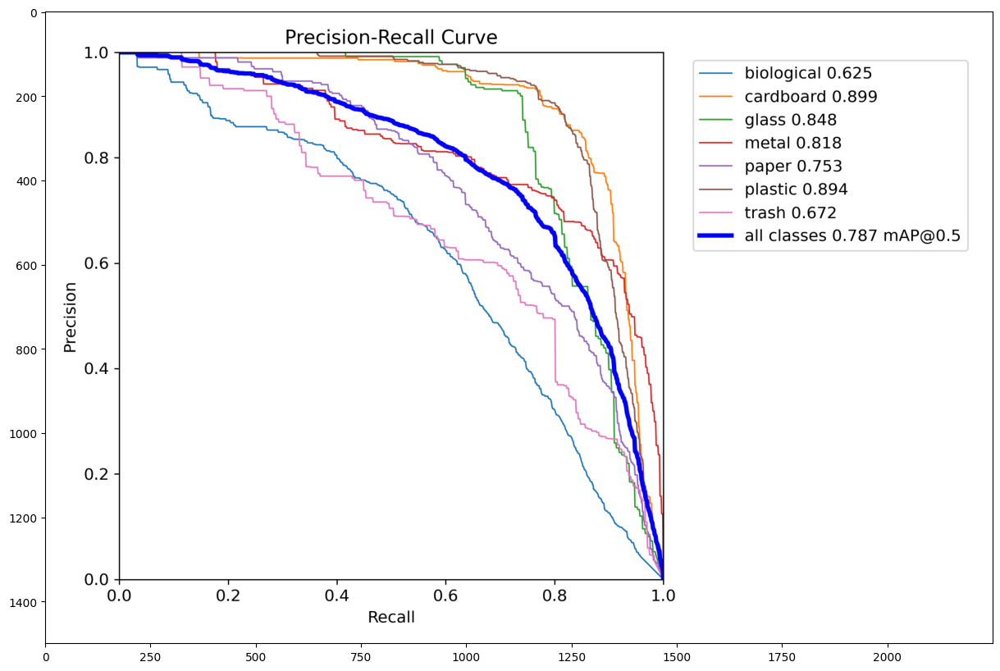

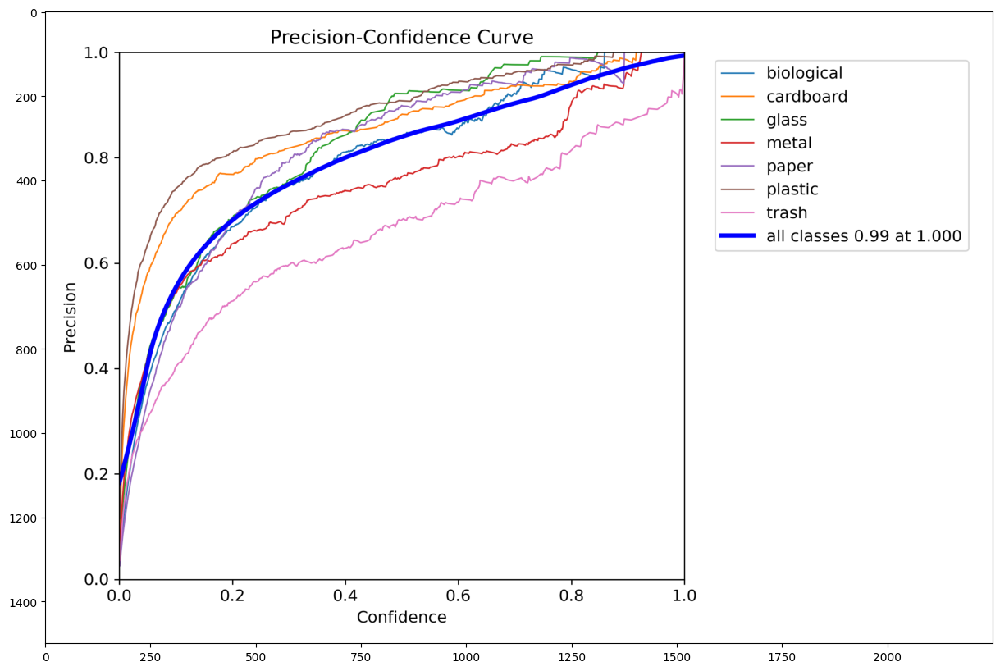

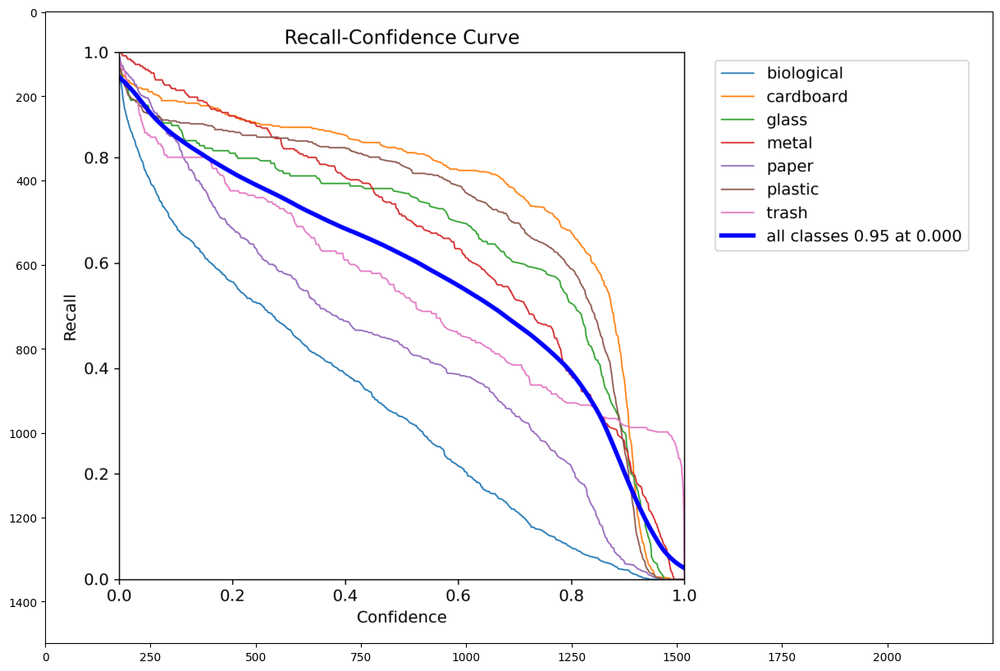

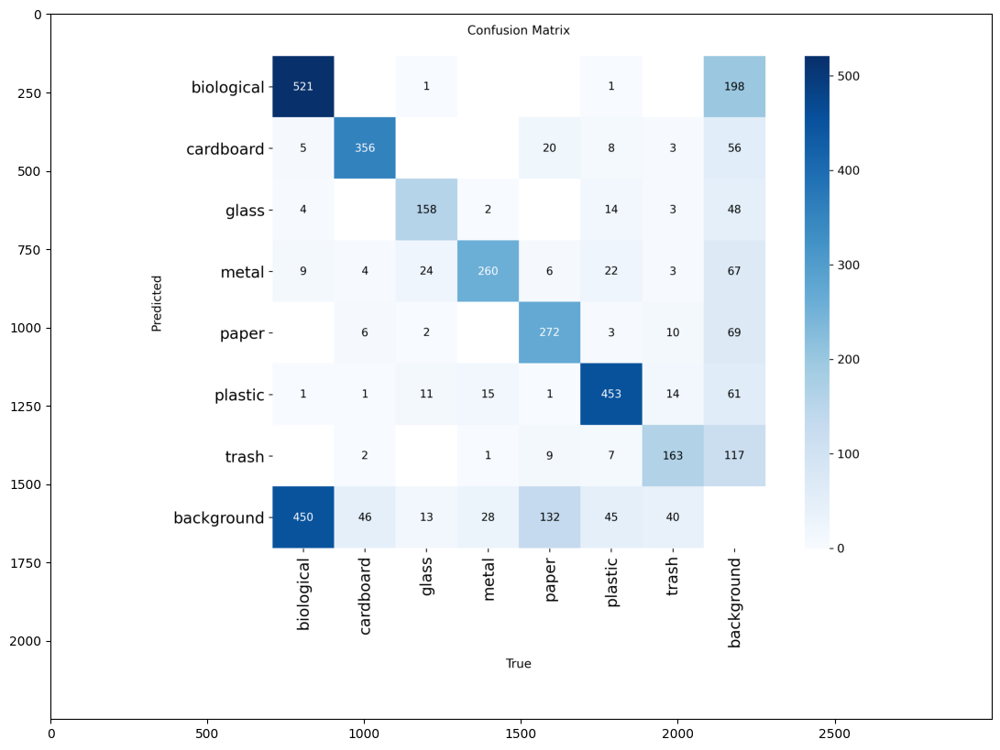

...

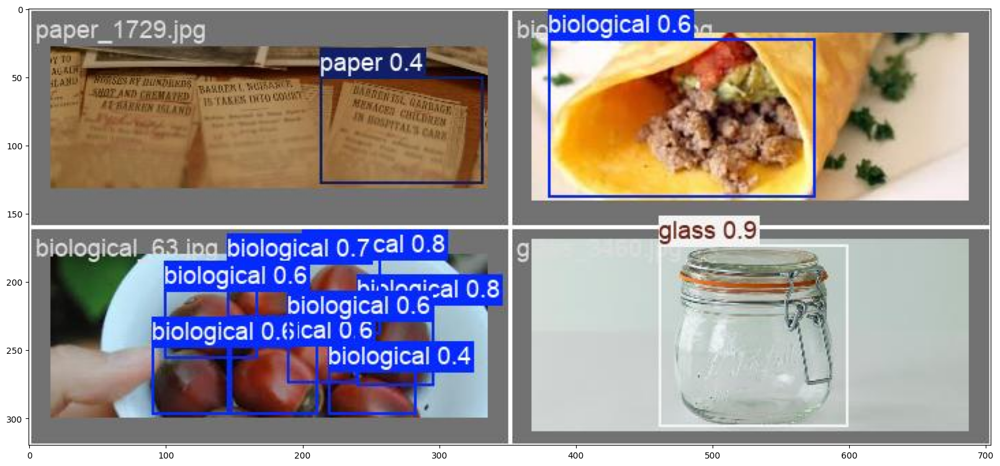

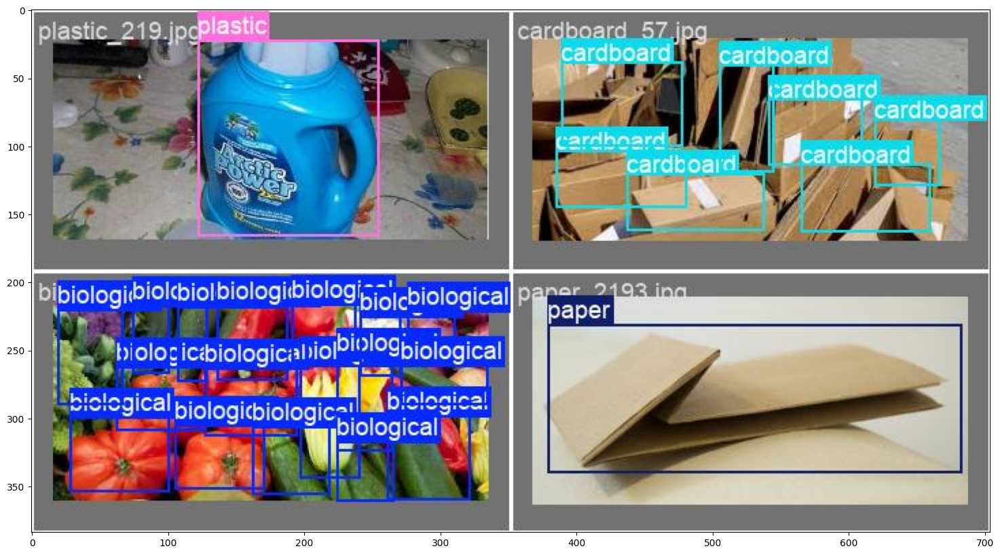

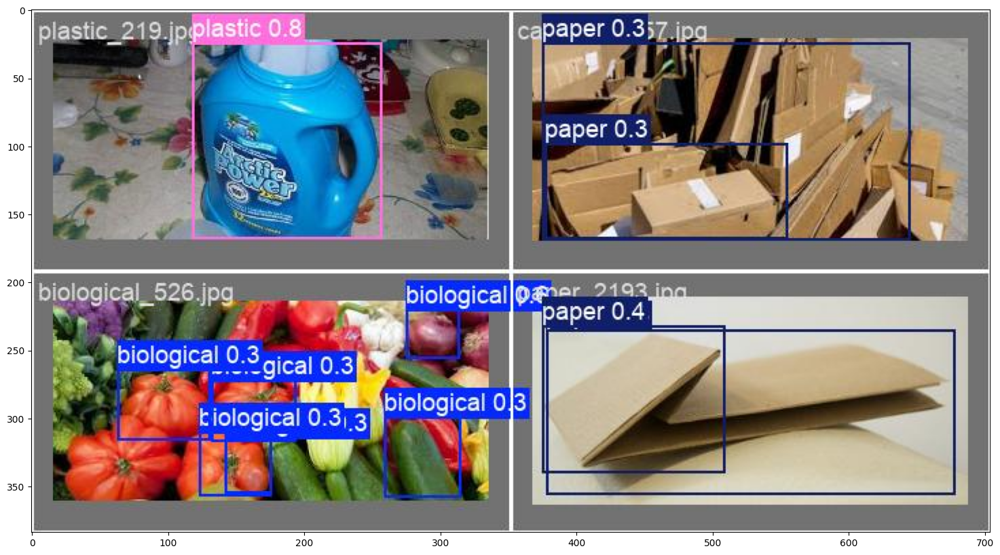

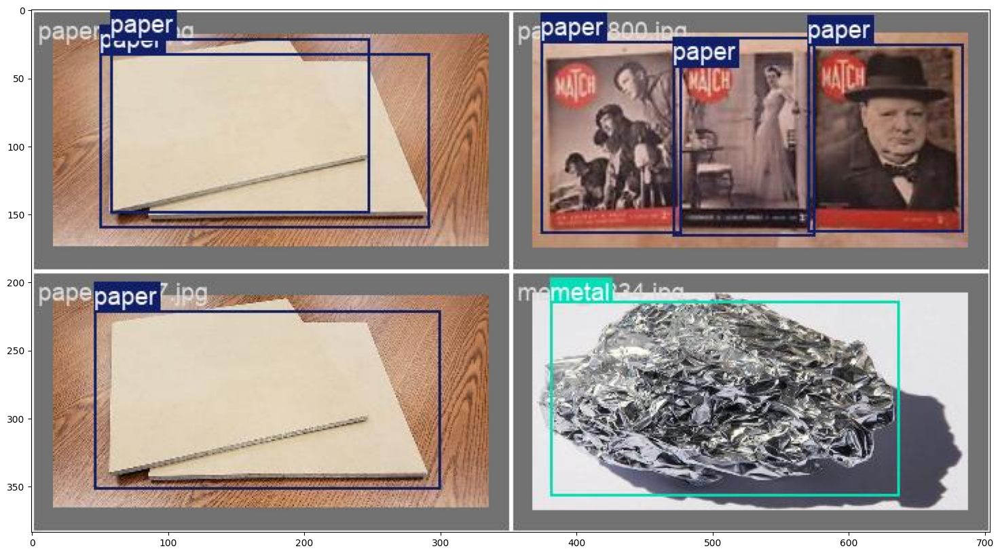

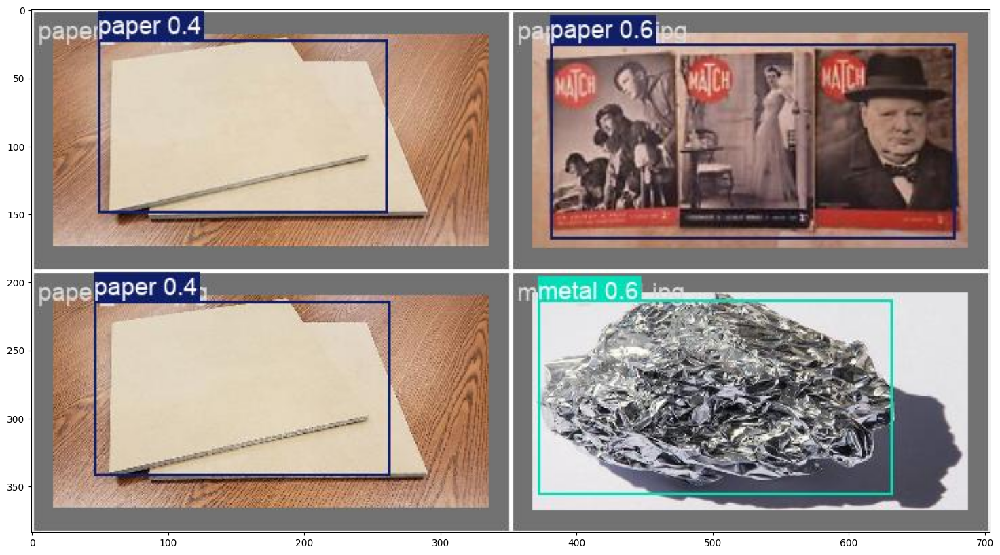

In [31]:
from PIL import Image
import glob

tpaths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/train'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            tpaths2+=[(os.path.join(dirname, filename))]
tpaths2=sorted(tpaths2)

print(tpaths2[0])


for path in tpaths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

[codecarbon WARNING @ 05:05:11] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon INFO @ 05:05:11] [setup] RAM Tracking...
[codecarbon INFO @ 05:05:11] [setup] CPU Tracking...


✅ Found 8896 images in class folders


[codecarbon WARNING @ 05:05:12] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon WARNING @ 05:05:12] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Linux OS detected: Please ensure RAPL files exist at /sys/class/powercap/intel-rapl/subsystem to measure CPU

[codecarbon INFO @ 05:05:12] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon WARNING @ 05:05:12] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 05:05:12] [setup] GPU Tracking...
[codecarbon INFO @ 05:05:12] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 05:05:12] GPU number 1 will not be monitored, at your request.
[codecarbon WARNING @ 05:05:12] You have 2 GPUs but we will monitor only 1 of them. Check your configuration.
[codecarbon INFO @ 05:05:12] The below tracking methods have been set up:
                RAM Tracking Method: RAM power estimation model
              

okish

image 1/1 /kaggle/working/combined_dataset/paper/paper_2817.jpg: 256x320 1 paper, 43.5ms
Speed: 0.9ms preprocess, 43.5ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 320)
Results saved to runs/detect/predict


[codecarbon INFO @ 05:05:16] Energy consumed for RAM : 0.000001 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 05:05:16] Delta energy consumed for CPU with constant : 0.000002 kWh, power : 42.5 W
[codecarbon INFO @ 05:05:16] Energy consumed for All CPU : 0.000002 kWh
[codecarbon INFO @ 05:05:16] GPU number 1 will not be monitored, at your request.
[codecarbon INFO @ 05:05:16] Energy consumed for all GPUs : 0.000002 kWh. Total GPU Power : 36.187133731016445 W
[codecarbon INFO @ 05:05:16] 0.000005 kWh of electricity used since the beginning.



First image inference time: 0.1814 seconds
Deploy Model Carbon Emissions for first image: 0.000001 kg

📸 Displaying results for: /kaggle/working/combined_dataset/paper/paper_2817.jpg


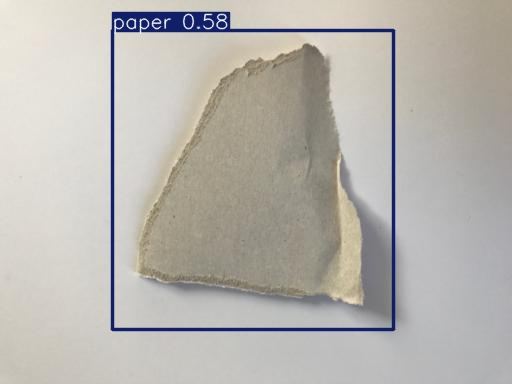


image 1/1 /kaggle/working/combined_dataset/trash/trash_769.jpg: 224x320 4 trashs, 43.1ms
Speed: 1.0ms preprocess, 43.1ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/trash/trash_769.jpg


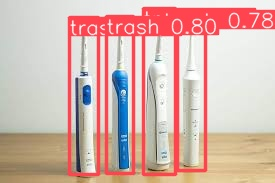


image 1/1 /kaggle/working/combined_dataset/metal/metal_2255.jpg: 224x320 (no detections), 8.7ms
Speed: 0.6ms preprocess, 8.7ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 320)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/metal/metal_2255.jpg


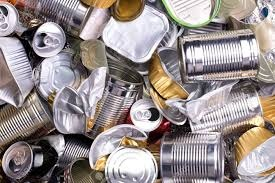


image 1/1 /kaggle/working/combined_dataset/plastic/plastic_848.jpg: 256x320 1 metal, 9.3ms
Speed: 0.8ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/plastic/plastic_848.jpg


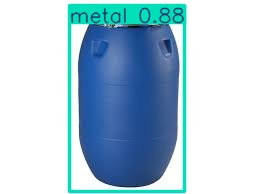


image 1/1 /kaggle/working/combined_dataset/metal/metal_2319.jpg: 256x320 1 metal, 8.3ms
Speed: 1.0ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/metal/metal_2319.jpg


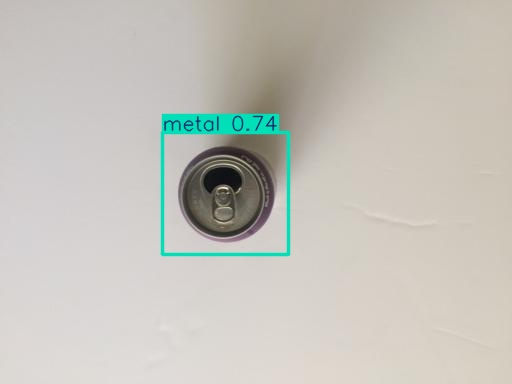


image 1/1 /kaggle/working/combined_dataset/biological/biological_838.jpg: 224x320 1 biological, 1 metal, 9.4ms
Speed: 0.6ms preprocess, 9.4ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/biological/biological_838.jpg


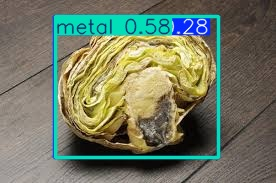


image 1/1 /kaggle/working/combined_dataset/paper/paper_1991.jpg: 256x320 1 paper, 9.4ms
Speed: 0.8ms preprocess, 9.4ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/paper/paper_1991.jpg


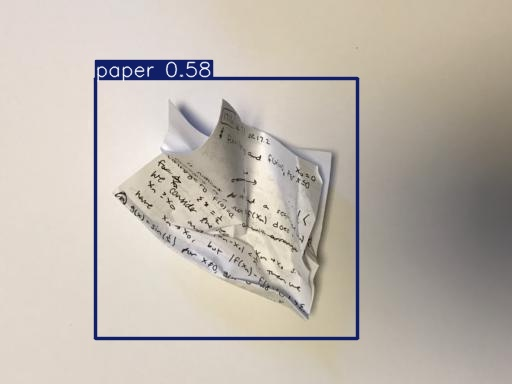


image 1/1 /kaggle/working/combined_dataset/trash/trash_515.jpg: 320x64 2 trashs, 41.2ms
Speed: 0.4ms preprocess, 41.2ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 64)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/trash/trash_515.jpg


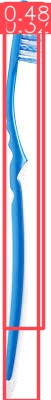


image 1/1 /kaggle/working/combined_dataset/metal/metal_414.jpg: 320x320 1 metal, 9.1ms
Speed: 0.7ms preprocess, 9.1ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/metal/metal_414.jpg


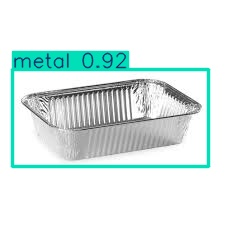


image 1/1 /kaggle/working/combined_dataset/plastic/plastic_2218.jpg: 256x320 1 plastic, 9.2ms
Speed: 0.8ms preprocess, 9.2ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
Results saved to runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/plastic/plastic_2218.jpg


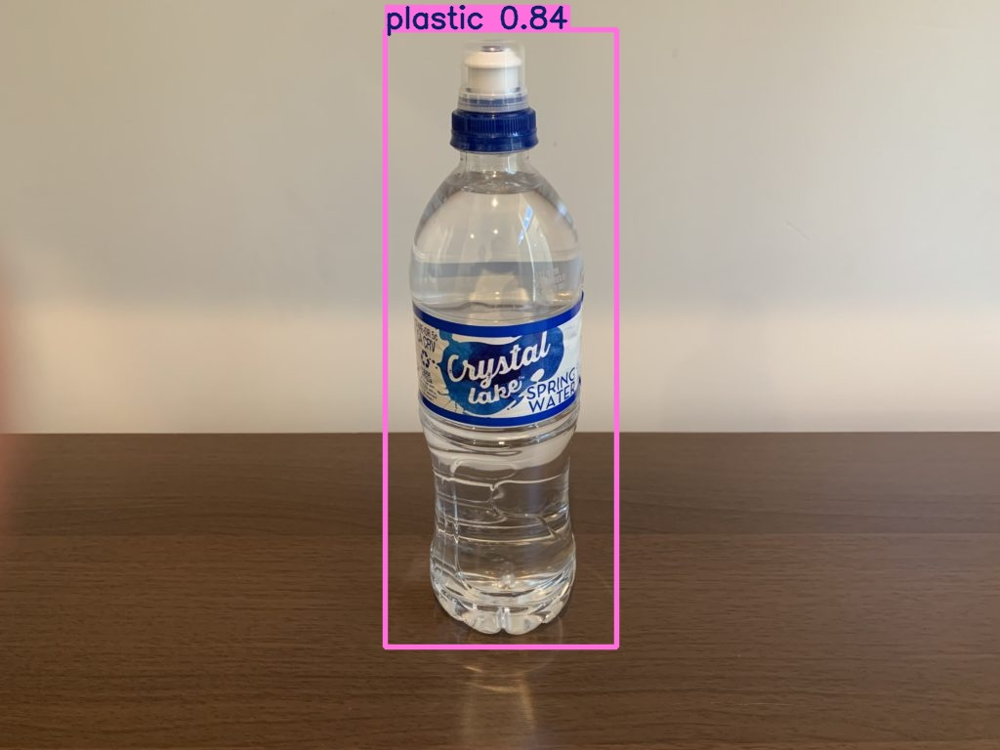

In [32]:
from pathlib import Path 
# Load the trained YOLO model
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")  # Update the path if needed

# Step 1: Collect all image paths recursively from class folders
image_paths = glob.glob("/kaggle/working/combined_dataset/*/*.jpg")
image_paths += glob.glob("/kaggle/working/combined_dataset/*/*.jpeg")
image_paths += glob.glob("/kaggle/working/combined_dataset/*/*.png")

print(f"✅ Found {len(image_paths)} images in class folders")

# Step 2: Select 10 random images
random_images = random.sample(image_paths, min(10, len(image_paths)))

# Run inference on each image and display results
for idx, image_path in enumerate(random_images):
    # Start emissions tracking only for the first image
    if idx == 0:
        deploy_model_emission_tracker = EmissionsTracker()
        deploy_model_emission_tracker.start()
        start_time = time.time()
        print('okish')
    # Inference
    results = model(image_path, save=True)

    # Stop emissions tracking for the first image
    if idx == 0:
        deploy_model_emissions = deploy_model_emission_tracker.stop()
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"\nFirst image inference time: {elapsed_time:.4f} seconds")
        print(f"Deploy Model Carbon Emissions for first image: {deploy_model_emissions:.6f} kg")

    # Get the output image path and display
    # ✅ FIXED: Use Path object for joining paths
    output_image_path = Path(results[0].save_dir) / image_path.split("/")[-1]
    print(f"\n📸 Displaying results for: {image_path}")
    display(Image.open(output_image_path))

In [33]:
# iOS
# !yolo export format=mlmodel model="/kaggle/working/runs/detect/train/weights/best.pt" imgsz=320,192 half nms

In [34]:
# !pip uninstall -y protobuf tflite-support
# !pip install --no-cache-dir "protobuf<5" "tflite-support==0.4.4"
# !pip install --no-cache-dir sng4onnx onnx_graphsurgeon onnx2tf onnxslim tflite_support onnxruntime

In [35]:
# # Android
# !yolo export format=tflite model="/kaggle/working/runs/detect/train/weights/best.pt" imgsz=320 half=True data="/kaggle/working/combined_dataset/dataset.yaml" # For detection